# Milestone 5

The objective of this notebook is to extend the finetuning of the SAM model to achieve better results during segmentation. This is done by passing an input visual prompt to the model by interactively selecting points on the image to denote where the sidewalk is being occluded by trees. The model takes this prompt as an additional input and segments the sidewalk through occlusions. 

The notebook contains two appraches to this problem, one with visual prompting and another one with text prompting.

### Installing dependencies

In [ ]:
!pip install datasets

In [ ]:
!pip install git+https://github.com/facebookresearch/segment-anything.git
!pip install -q git+https://github.com/huggingface/transformers.git

In [3]:
# library used for interactively selecting points on an image
!pip install ipympl

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 516.3/516.3 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 12.3 MB/s eta 0:00:00


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Dataset Preparation and Finetuned Model Initilization

In [5]:
# downloading val set from huggingface
from datasets import load_dataset
dataset = load_dataset("back2classroom/sidewalks", split='val')

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Generating train split:   0%|          | 0/180000 [00:00<?, ? examples/s]

Generating val split:   0%|          | 0/19999 [00:00<?, ? examples/s]

In [6]:
dataset

Dataset({
    features: ['filename', 'tfw', 'tif', 'label_tif', 'label_tfw'],
    num_rows: 19999
})

In [7]:
from PIL import Image
import io
import matplotlib.pyplot as plt
import numpy as np

# converting the images and labels to PIL images from Bytes
image_list = []
label_list = []
for item in dataset:
  image_list.append(Image.open(io.BytesIO(item['tif'])))
  label = Image.open(io.BytesIO(item['label_tif']))
  label_list.append(np.array(label))

In [8]:
# removing empty labels
valid_indices = [i for i, mask in enumerate(label_list) if mask.max() != 0]

In [9]:
# creating a list of valid images
new_image_list = [image_list[i] for i in valid_indices]

In [10]:
# creating a list of valid labels
new_label_list = [label_list[i] for i in valid_indices]

In [11]:
from transformers import SamModel, SamConfig, SamProcessor
import torch

In [12]:
# Load the model configuration
model_config = SamConfig.from_pretrained("facebook/sam-vit-base")
processor = SamProcessor.from_pretrained("facebook/sam-vit-base")

# Create an instance of the model architecture with the loaded configuration
my_mito_model = SamModel(config=model_config)

#Update the model by loading the weights from saved file.
my_mito_model.load_state_dict(torch.load("/content/drive/MyDrive/mito_model_checkpoint.pth", map_location=torch.device('cpu')))

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/6.57k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/466 [00:00<?, ?B/s]

<All keys matched successfully>

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
my_mito_model.to(device)

In [14]:
#Get bounding boxes from mask.
def get_bounding_box(ground_truth_map):
  # get bounding box from mask
  y_indices, x_indices = np.where(ground_truth_map > 0)
  x_min, x_max = np.min(x_indices), np.max(x_indices)
  y_min, y_max = np.min(y_indices), np.max(y_indices)

  # add perturbation to bounding box coordinates
  H, W = ground_truth_map.shape
  x_min = max(0, x_min - np.random.randint(0, 20))
  x_max = min(W, x_max + np.random.randint(0, 20))
  y_min = max(0, y_min - np.random.randint(0, 20))
  y_max = min(H, y_max + np.random.randint(0, 20))
  bbox = [x_min, y_min, x_max, y_max]

  return bbox

In [15]:
from google.colab import output
output.enable_custom_widget_manager()
%matplotlib ipympl

### Our Approach

In our apporach, to avoid occlusions, we interactively select points along the original image to denote where the trees are occluding the sidewalk. These points are passed as a prompt to our finetuned SAM model and the model returns a new segmented image where the sidewalk is not occluded by trees

Below, we tested the approach on 10 example images. In each section you will find the original image, the ground truth, a segmentation mask generated without prompting, and a segmenatition mask generated with prompting.

#### Example Image 1

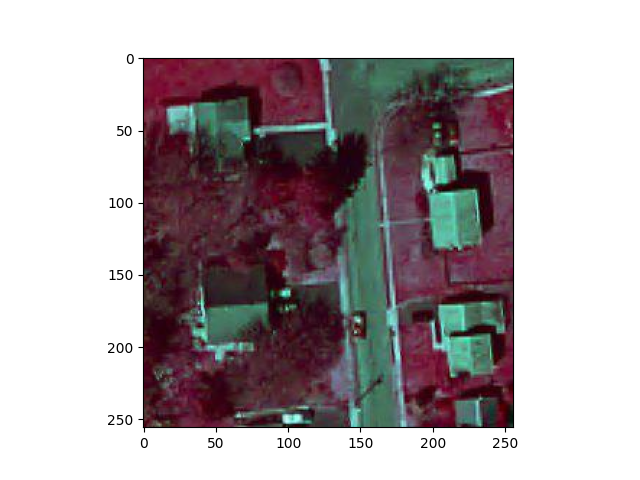

[129.5779220779221, 52.41774891774887]
[132.34848484848487, 62.80735930735926]
[132.34848484848487, 74.58225108225105]
[135.11904761904765, 87.74242424242419]
[135.81168831168833, 106.44372294372292]
[137.19696969696972, 118.91125541125538]
[137.8896103896104, 136.2272727272727]
[137.19696969696972, 150.08008658008654]
[138.5822510822511, 168.08874458874456]
[138.5822510822511, 179.17099567099564]
[139.27489177489178, 188.86796536796533]
[141.35281385281388, 200.6428571428571]
[142.04545454545456, 212.4177489177489]
[144.12337662337666, 225.57792207792204]
[144.81601731601734, 239.43073593073592]


In [16]:
fig, ax = plt.subplots()
ax.imshow(new_image_list[109])
plt.axis('on')


input_points = []
def onclick(event):
    in_pt = [event.xdata, event.ydata]
    print(in_pt)
    input_points.append(in_pt)

    # Mark the clicked point with a red dot
    ax.plot(event.xdata, event.ydata, 'ro')
    plt.draw()

cid = fig.canvas.mpl_connect('button_press_event', onclick)

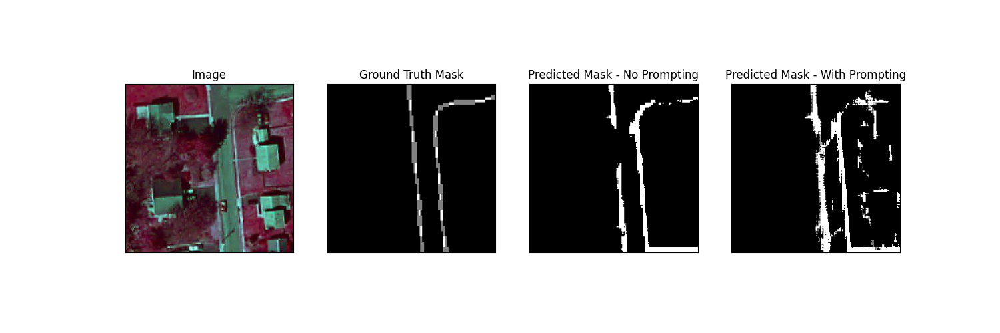

In [17]:
# load image
test_image = new_image_list[109]

# get box prompt based on ground truth segmentation map
ground_truth_mask = np.array(new_label_list[109])
prompt = get_bounding_box(ground_truth_mask)

# prepare image + box prompt for the model
noPrompt_inputs = processor(test_image, input_boxes=[[prompt]], return_tensors="pt")
prompt_inputs = processor(test_image, input_boxes=[[prompt]], input_points=[[input_points]], return_tensors="pt")

# Move the input tensor to the GPU if it's not already there
noPrompt_inputs = {k: v.to(device) for k, v in noPrompt_inputs.items()}
prompt_inputs = {k: v.to(device) for k, v in prompt_inputs.items()}

my_mito_model.eval()

# forward pass
with torch.no_grad():
    noPrompt_outputs = my_mito_model(**noPrompt_inputs, multimask_output=False)
    prompt_outputs = my_mito_model(**prompt_inputs, multimask_output=False)

# apply sigmoid
noPrompt_medsam_seg_prob = torch.sigmoid(noPrompt_outputs.pred_masks.squeeze(1))
prompt_medsam_seg_prob = torch.sigmoid(prompt_outputs.pred_masks.squeeze(1))

# convert soft mask to hard mask
noPrompt_medsam_seg_prob = noPrompt_medsam_seg_prob.cpu().numpy().squeeze()
prompt_medsam_seg_prob = prompt_medsam_seg_prob.cpu().numpy().squeeze()

noPrompt_medsam_seg = (noPrompt_medsam_seg_prob > 0.5).astype(np.uint8)
prompt_medsam_seg = (prompt_medsam_seg_prob > 0.5).astype(np.uint8)


fig, axes = plt.subplots(1, 4, figsize=(15, 5))

# Plot the test image
axes[0].imshow(np.array(test_image), cmap='viridis')
axes[0].set_title("Image")

# Plot the ground truth mask
axes[1].imshow(ground_truth_mask, cmap='gray')
axes[1].set_title("Ground Truth Mask")

# Plot the predicted mask without prompting
axes[2].imshow(noPrompt_medsam_seg, cmap='gray')
axes[2].set_title("Predicted Mask - No Prompting")

# Plot the predicted mask with prompting
axes[3].imshow(prompt_medsam_seg, cmap='gray')
axes[3].set_title("Predicted Mask - With Prompting")

for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

plt.show()

#### Example Image 2

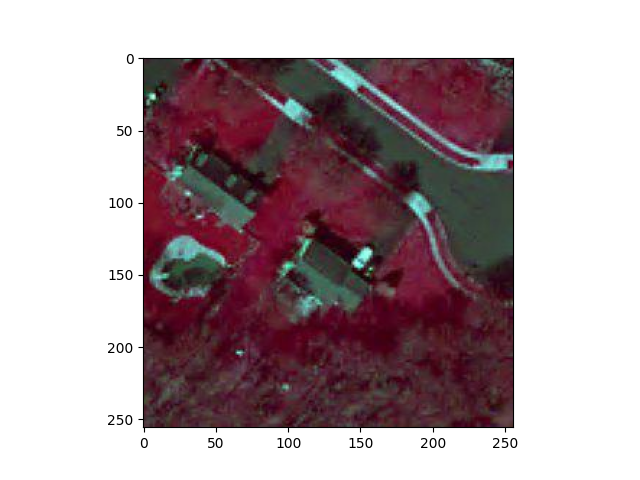

[107.41341991341992, 43.41341991341986]
[130.96320346320348, 58.6515151515151]
[161.43939393939394, 82.20129870129867]
[187.0670995670996, 105.75108225108221]
[216.15800865800867, 157.00649350649348]
[252.86796536796538, 171.55194805194802]
[236.93722943722946, 167.39610389610385]


In [47]:
fig, ax = plt.subplots()
ax.imshow(new_image_list[111])
plt.axis('on')


input_points = []
def onclick(event):
    in_pt = [event.xdata, event.ydata]
    print(in_pt)
    input_points.append(in_pt)

    # Mark the clicked point with a red dot
    ax.plot(event.xdata, event.ydata, 'ro')
    plt.draw()

cid = fig.canvas.mpl_connect('button_press_event', onclick)

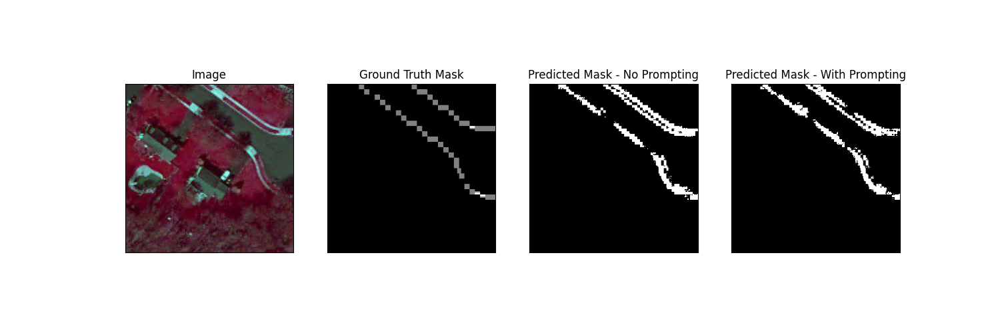

In [48]:
# load image
test_image = new_image_list[111]

# get box prompt based on ground truth segmentation map
ground_truth_mask = np.array(new_label_list[111])
prompt = get_bounding_box(ground_truth_mask)

# prepare image + box prompt for the model
noPrompt_inputs = processor(test_image, input_boxes=[[prompt]], return_tensors="pt")
prompt_inputs = processor(test_image, input_boxes=[[prompt]], input_points=[[input_points]], return_tensors="pt")

# Move the input tensor to the GPU if it's not already there
noPrompt_inputs = {k: v.to(device) for k, v in noPrompt_inputs.items()}
prompt_inputs = {k: v.to(device) for k, v in prompt_inputs.items()}

my_mito_model.eval()

# forward pass
with torch.no_grad():
    noPrompt_outputs = my_mito_model(**noPrompt_inputs, multimask_output=False)
    prompt_outputs = my_mito_model(**prompt_inputs, multimask_output=False)

# apply sigmoid
noPrompt_medsam_seg_prob = torch.sigmoid(noPrompt_outputs.pred_masks.squeeze(1))
prompt_medsam_seg_prob = torch.sigmoid(prompt_outputs.pred_masks.squeeze(1))

# convert soft mask to hard mask
noPrompt_medsam_seg_prob = noPrompt_medsam_seg_prob.cpu().numpy().squeeze()
prompt_medsam_seg_prob = prompt_medsam_seg_prob.cpu().numpy().squeeze()

noPrompt_medsam_seg = (noPrompt_medsam_seg_prob > 0.5).astype(np.uint8)
prompt_medsam_seg = (prompt_medsam_seg_prob > 0.5).astype(np.uint8)


fig, axes = plt.subplots(1, 4, figsize=(15, 5))

# Plot the test image
axes[0].imshow(np.array(test_image), cmap='viridis')
axes[0].set_title("Image")

# Plot the ground truth mask
axes[1].imshow(ground_truth_mask, cmap='gray')
axes[1].set_title("Ground Truth Mask")

# Plot the predicted mask without prompting
axes[2].imshow(noPrompt_medsam_seg, cmap='gray')
axes[2].set_title("Predicted Mask - No Prompting")

# Plot the predicted mask with prompting
axes[3].imshow(prompt_medsam_seg, cmap='gray')
axes[3].set_title("Predicted Mask - With Prompting")

for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

plt.show()

#### Example Image 3

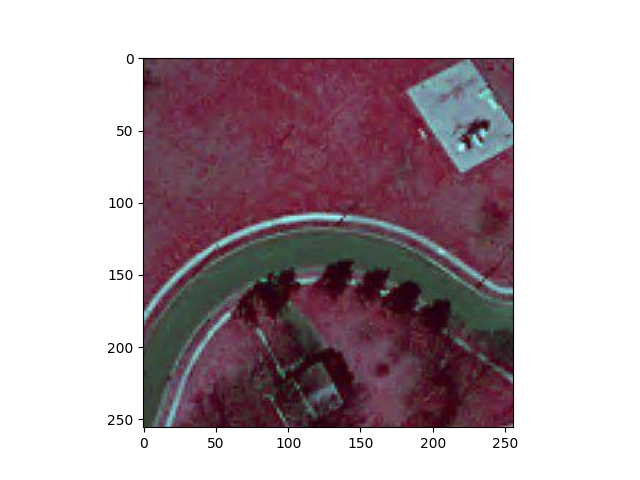

[17.370129870129873, 252.59090909090907]
[23.603896103896105, 232.50432900432898]
[31.22294372294374, 213.80303030303028]
[40.91991341991343, 197.87229437229433]
[58.23593073593074, 177.78571428571425]
[69.31818181818184, 170.16666666666663]
[81.7857142857143, 161.85497835497833]
[94.25324675324677, 156.31385281385278]
[108.10606060606062, 154.2359307359307]
[121.2662337662338, 153.54329004329]
[133.73376623376626, 154.2359307359307]
[146.20129870129873, 155.6212121212121]
[157.2835497835498, 158.39177489177487]
[167.67316017316017, 162.547619047619]
[175.29220779220782, 168.08874458874456]
[187.0670995670996, 175.70779220779218]
[195.37878787878793, 180.55627705627703]
[207.15367965367966, 188.17532467532465]
[216.8506493506494, 194.40909090909088]
[227.93290043290045, 202.7207792207792]
[239.70779220779224, 212.4177489177489]
[249.40476190476193, 217.95887445887445]


In [37]:
fig, ax = plt.subplots()
ax.imshow(new_image_list[118])
plt.axis('on')


input_points = []
def onclick(event):
    in_pt = [event.xdata, event.ydata]
    print(in_pt)
    input_points.append(in_pt)

    # Mark the clicked point with a red dot
    ax.plot(event.xdata, event.ydata, 'ro')
    plt.draw()

cid = fig.canvas.mpl_connect('button_press_event', onclick)

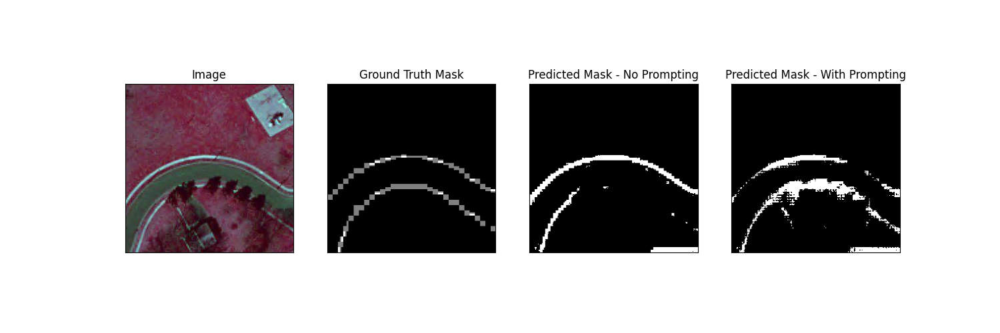

In [38]:
# load image
test_image = new_image_list[118]

# get box prompt based on ground truth segmentation map
ground_truth_mask = np.array(new_label_list[118])
prompt = get_bounding_box(ground_truth_mask)

# prepare image + box prompt for the model
noPrompt_inputs = processor(test_image, input_boxes=[[prompt]], return_tensors="pt")
prompt_inputs = processor(test_image, input_boxes=[[prompt]], input_points=[[input_points]], return_tensors="pt")

# Move the input tensor to the GPU if it's not already there
noPrompt_inputs = {k: v.to(device) for k, v in noPrompt_inputs.items()}
prompt_inputs = {k: v.to(device) for k, v in prompt_inputs.items()}

my_mito_model.eval()

# forward pass
with torch.no_grad():
    noPrompt_outputs = my_mito_model(**noPrompt_inputs, multimask_output=False)
    prompt_outputs = my_mito_model(**prompt_inputs, multimask_output=False)

# apply sigmoid
noPrompt_medsam_seg_prob = torch.sigmoid(noPrompt_outputs.pred_masks.squeeze(1))
prompt_medsam_seg_prob = torch.sigmoid(prompt_outputs.pred_masks.squeeze(1))

# convert soft mask to hard mask
noPrompt_medsam_seg_prob = noPrompt_medsam_seg_prob.cpu().numpy().squeeze()
prompt_medsam_seg_prob = prompt_medsam_seg_prob.cpu().numpy().squeeze()

noPrompt_medsam_seg = (noPrompt_medsam_seg_prob > 0.5).astype(np.uint8)
prompt_medsam_seg = (prompt_medsam_seg_prob > 0.5).astype(np.uint8)


fig, axes = plt.subplots(1, 4, figsize=(15, 5))

# Plot the test image
axes[0].imshow(np.array(test_image), cmap='viridis')
axes[0].set_title("Image")

# Plot the ground truth mask
axes[1].imshow(ground_truth_mask, cmap='gray')
axes[1].set_title("Ground Truth Mask")

# Plot the predicted mask without prompting
axes[2].imshow(noPrompt_medsam_seg, cmap='gray')
axes[2].set_title("Predicted Mask - No Prompting")

# Plot the predicted mask with prompting
axes[3].imshow(prompt_medsam_seg, cmap='gray')
axes[3].set_title("Predicted Mask - With Prompting")

for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

plt.show()

#### Example Image 4

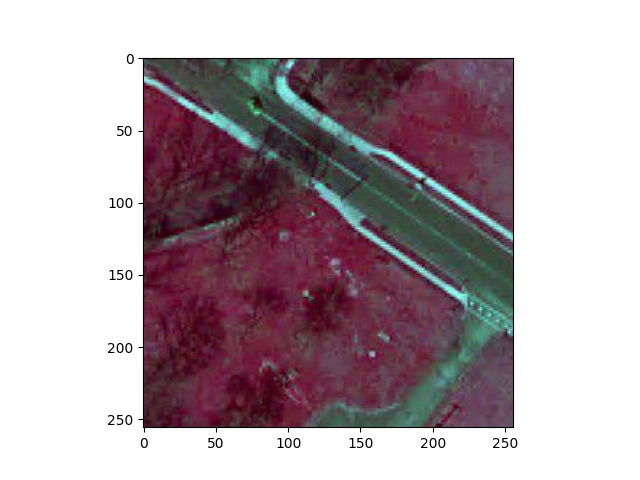

[75.55194805194807, 60.03679653679649]
[85.94155844155844, 64.88528138528133]
[92.1753246753247, 68.34848484848482]
[98.40909090909093, 73.88961038961034]
[108.7987012987013, 81.50865800865796]
[115.72510822510824, 84.97186147186144]
[123.34415584415586, 89.82034632034629]


In [26]:
fig, ax = plt.subplots()
ax.imshow(new_image_list[135])
plt.axis('on')


input_points = []
def onclick(event):
    in_pt = [event.xdata, event.ydata]
    print(in_pt)
    input_points.append(in_pt)

    # Mark the clicked point with a red dot
    ax.plot(event.xdata, event.ydata, 'ro')
    plt.draw()

cid = fig.canvas.mpl_connect('button_press_event', onclick)

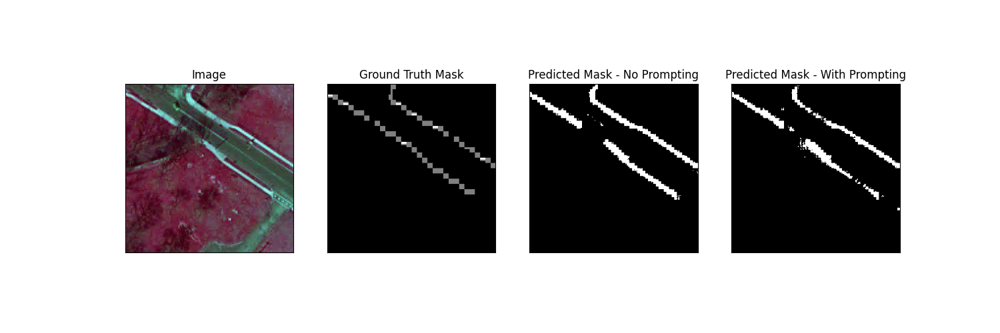

In [27]:
# load image
test_image = new_image_list[135]

# get box prompt based on ground truth segmentation map
ground_truth_mask = np.array(new_label_list[135])
prompt = get_bounding_box(ground_truth_mask)

# prepare image + box prompt for the model
noPrompt_inputs = processor(test_image, input_boxes=[[prompt]], return_tensors="pt")
prompt_inputs = processor(test_image, input_boxes=[[prompt]], input_points=[[input_points]], return_tensors="pt")

# Move the input tensor to the GPU if it's not already there
noPrompt_inputs = {k: v.to(device) for k, v in noPrompt_inputs.items()}
prompt_inputs = {k: v.to(device) for k, v in prompt_inputs.items()}

my_mito_model.eval()

# forward pass
with torch.no_grad():
    noPrompt_outputs = my_mito_model(**noPrompt_inputs, multimask_output=False)
    prompt_outputs = my_mito_model(**prompt_inputs, multimask_output=False)

# apply sigmoid
noPrompt_medsam_seg_prob = torch.sigmoid(noPrompt_outputs.pred_masks.squeeze(1))
prompt_medsam_seg_prob = torch.sigmoid(prompt_outputs.pred_masks.squeeze(1))

# convert soft mask to hard mask
noPrompt_medsam_seg_prob = noPrompt_medsam_seg_prob.cpu().numpy().squeeze()
prompt_medsam_seg_prob = prompt_medsam_seg_prob.cpu().numpy().squeeze()

noPrompt_medsam_seg = (noPrompt_medsam_seg_prob > 0.5).astype(np.uint8)
prompt_medsam_seg = (prompt_medsam_seg_prob > 0.5).astype(np.uint8)


fig, axes = plt.subplots(1, 4, figsize=(15, 5))

# Plot the test image
axes[0].imshow(np.array(test_image), cmap='viridis')
axes[0].set_title("Image")

# Plot the ground truth mask
axes[1].imshow(ground_truth_mask, cmap='gray')
axes[1].set_title("Ground Truth Mask")

# Plot the predicted mask without prompting
axes[2].imshow(noPrompt_medsam_seg, cmap='gray')
axes[2].set_title("Predicted Mask - No Prompting")

# Plot the predicted mask with prompting
axes[3].imshow(prompt_medsam_seg, cmap='gray')
axes[3].set_title("Predicted Mask - With Prompting")

for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

plt.show()

#### Example Image 5

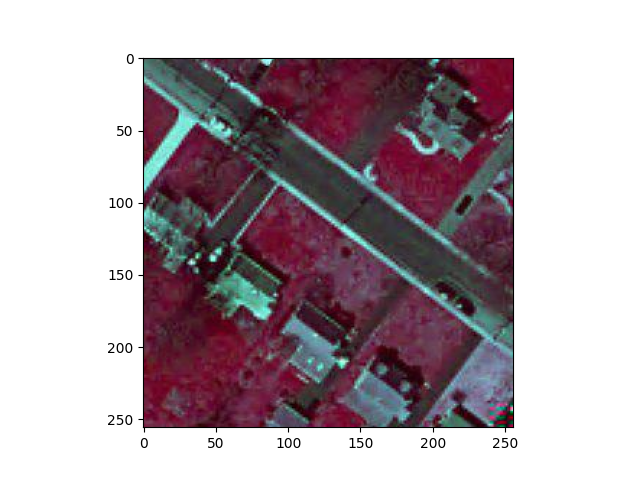

[55.46536796536799, 56.57359307359303]
[63.77705627705629, 63.49999999999994]
[74.16666666666669, 69.7337662337662]
[81.7857142857143, 73.19696969696966]
[87.32683982683983, 79.43073593073589]
[219.62121212121212, 134.8419913419913]
[230.01082251082255, 141.76839826839824]
[237.62987012987014, 148.00216450216448]
[245.94155844155847, 153.54329004329]
[254.94588744588748, 161.16233766233762]
[83.1709956709957, 32.33116883116878]
[88.71212121212122, 36.487012987012946]
[96.33116883116884, 42.72077922077918]
[103.95021645021646, 48.2619047619047]


In [28]:
fig, ax = plt.subplots()
ax.imshow(new_image_list[85])
plt.axis('on')


input_points = []
def onclick(event):
    in_pt = [event.xdata, event.ydata]
    print(in_pt)
    input_points.append(in_pt)

    # Mark the clicked point with a red dot
    ax.plot(event.xdata, event.ydata, 'ro')
    plt.draw()

cid = fig.canvas.mpl_connect('button_press_event', onclick)

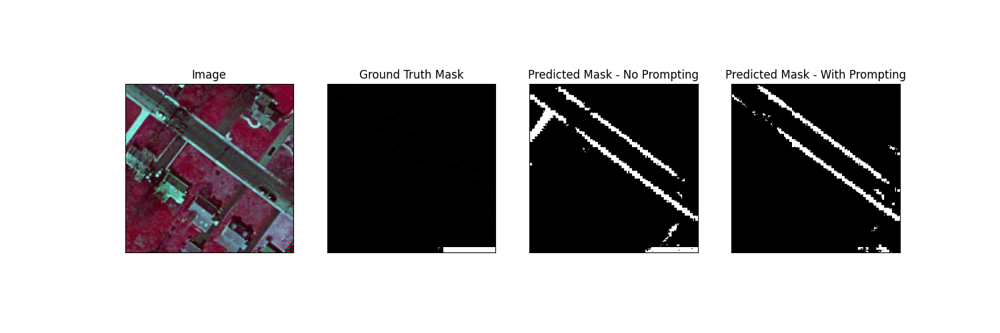

In [29]:
# load image
test_image = new_image_list[85]

# get box prompt based on ground truth segmentation map
ground_truth_mask = np.array(new_label_list[85])
prompt = get_bounding_box(ground_truth_mask)

# prepare image + box prompt for the model
noPrompt_inputs = processor(test_image, input_boxes=[[prompt]], return_tensors="pt")
prompt_inputs = processor(test_image, input_boxes=[[prompt]], input_points=[[input_points]], return_tensors="pt")

# Move the input tensor to the GPU if it's not already there
noPrompt_inputs = {k: v.to(device) for k, v in noPrompt_inputs.items()}
prompt_inputs = {k: v.to(device) for k, v in prompt_inputs.items()}

my_mito_model.eval()

# forward pass
with torch.no_grad():
    noPrompt_outputs = my_mito_model(**noPrompt_inputs, multimask_output=False)
    prompt_outputs = my_mito_model(**prompt_inputs, multimask_output=False)

# apply sigmoid
noPrompt_medsam_seg_prob = torch.sigmoid(noPrompt_outputs.pred_masks.squeeze(1))
prompt_medsam_seg_prob = torch.sigmoid(prompt_outputs.pred_masks.squeeze(1))

# convert soft mask to hard mask
noPrompt_medsam_seg_prob = noPrompt_medsam_seg_prob.cpu().numpy().squeeze()
prompt_medsam_seg_prob = prompt_medsam_seg_prob.cpu().numpy().squeeze()

noPrompt_medsam_seg = (noPrompt_medsam_seg_prob > 0.5).astype(np.uint8)
prompt_medsam_seg = (prompt_medsam_seg_prob > 0.5).astype(np.uint8)


fig, axes = plt.subplots(1, 4, figsize=(15, 5))

# Plot the test image
axes[0].imshow(np.array(test_image), cmap='viridis')
axes[0].set_title("Image")

# Plot the ground truth mask
axes[1].imshow(ground_truth_mask, cmap='gray')
axes[1].set_title("Ground Truth Mask")

# Plot the predicted mask without prompting
axes[2].imshow(noPrompt_medsam_seg, cmap='gray')
axes[2].set_title("Predicted Mask - No Prompting")

# Plot the predicted mask with prompting
axes[3].imshow(prompt_medsam_seg, cmap='gray')
axes[3].set_title("Predicted Mask - With Prompting")

for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

plt.show()

#### Example Image 6

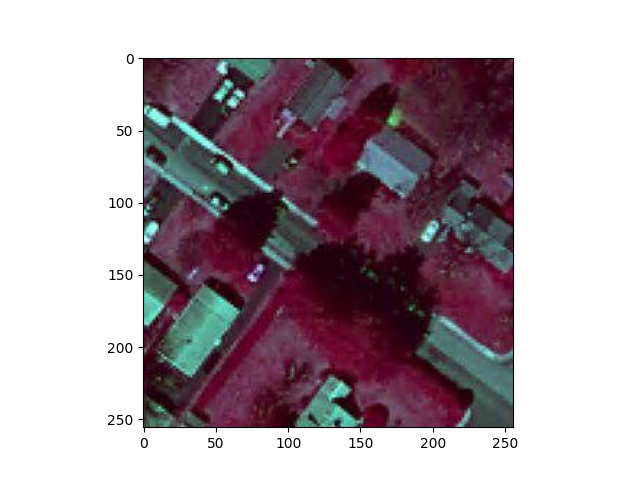

[27.75974025974027, 89.12770562770558]
[49.924242424242436, 105.75108225108221]
[63.08441558441558, 117.525974025974]
[76.24458874458875, 127.22294372294368]
[92.86796536796538, 138.30519480519476]
[100.487012987013, 145.92424242424238]


In [58]:
fig, ax = plt.subplots()
ax.imshow(new_image_list[106])
plt.axis('on')


input_points = []
def onclick(event):
    in_pt = [event.xdata, event.ydata]
    print(in_pt)
    input_points.append(in_pt)

    # Mark the clicked point with a red dot
    ax.plot(event.xdata, event.ydata, 'ro')
    plt.draw()

cid = fig.canvas.mpl_connect('button_press_event', onclick)

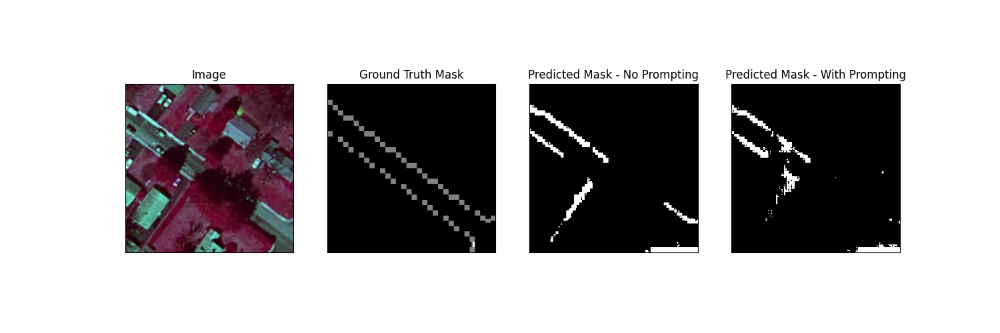

In [78]:
# load image
test_image = new_image_list[106]

# get box prompt based on ground truth segmentation map
ground_truth_mask = np.array(new_label_list[106])
prompt = get_bounding_box(ground_truth_mask)

# prepare image + box prompt for the model
noPrompt_inputs = processor(test_image, input_boxes=[[prompt]], return_tensors="pt")
prompt_inputs = processor(test_image, input_boxes=[[prompt]], input_points=[[input_points]], return_tensors="pt")

# Move the input tensor to the GPU if it's not already there
noPrompt_inputs = {k: v.to(device) for k, v in noPrompt_inputs.items()}
prompt_inputs = {k: v.to(device) for k, v in prompt_inputs.items()}

my_mito_model.eval()

# forward pass
with torch.no_grad():
    noPrompt_outputs = my_mito_model(**noPrompt_inputs, multimask_output=False)
    prompt_outputs = my_mito_model(**prompt_inputs, multimask_output=False)

# apply sigmoid
noPrompt_medsam_seg_prob = torch.sigmoid(noPrompt_outputs.pred_masks.squeeze(1))
prompt_medsam_seg_prob = torch.sigmoid(prompt_outputs.pred_masks.squeeze(1))

# convert soft mask to hard mask
noPrompt_medsam_seg_prob = noPrompt_medsam_seg_prob.cpu().numpy().squeeze()
prompt_medsam_seg_prob = prompt_medsam_seg_prob.cpu().numpy().squeeze()

noPrompt_medsam_seg = (noPrompt_medsam_seg_prob > 0.5).astype(np.uint8)
prompt_medsam_seg = (prompt_medsam_seg_prob > 0.5).astype(np.uint8)


fig, axes = plt.subplots(1, 4, figsize=(15, 5))

# Plot the test image
axes[0].imshow(np.array(test_image), cmap='viridis')
axes[0].set_title("Image")

# Plot the ground truth mask
axes[1].imshow(ground_truth_mask, cmap='gray')
axes[1].set_title("Ground Truth Mask")

# Plot the predicted mask without prompting
axes[2].imshow(noPrompt_medsam_seg, cmap='gray')
axes[2].set_title("Predicted Mask - No Prompting")

# Plot the predicted mask with prompting
axes[3].imshow(prompt_medsam_seg, cmap='gray')
axes[3].set_title("Predicted Mask - With Prompting")

for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

plt.show()

#### Example Image 7

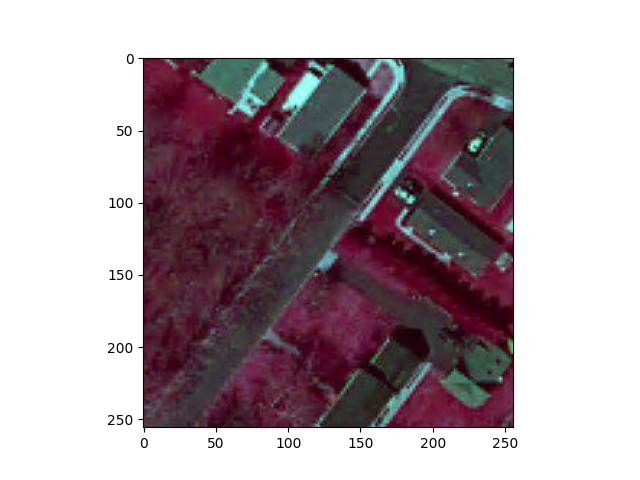

[139.9675324675325, 64.88528138528133]
[121.95887445887448, 89.12770562770558]
[110.18398268398269, 105.05844155844153]
[98.40909090909093, 122.37445887445884]
[83.86363636363637, 138.99783549783547]
[70.01082251082252, 157.00649350649348]
[59.621212121212125, 175.0151515151515]
[49.23160173160173, 186.79004329004326]
[42.305194805194816, 197.87229437229433]
[27.067099567099575, 214.49567099567096]
[21.525974025974037, 222.11471861471858]
[10.443722943722946, 236.66017316017314]
[2.1320346320346317, 249.1277056277056]


In [82]:
fig, ax = plt.subplots()
ax.imshow(new_image_list[75])
plt.axis('on')


input_points = []
def onclick(event):
    in_pt = [event.xdata, event.ydata]
    print(in_pt)
    input_points.append(in_pt)

    # Mark the clicked point with a red dot
    ax.plot(event.xdata, event.ydata, 'ro')
    plt.draw()

cid = fig.canvas.mpl_connect('button_press_event', onclick)

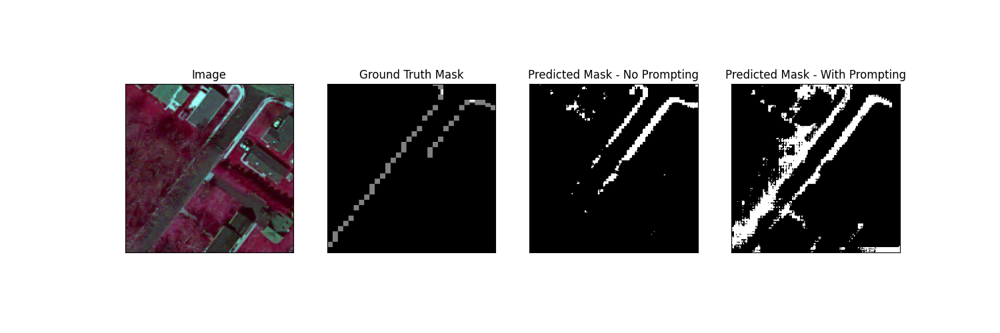

In [83]:
# load image
test_image = new_image_list[75]

# get box prompt based on ground truth segmentation map
ground_truth_mask = np.array(new_label_list[75])
prompt = get_bounding_box(ground_truth_mask)

# prepare image + box prompt for the model
noPrompt_inputs = processor(test_image, input_boxes=[[prompt]], return_tensors="pt")
prompt_inputs = processor(test_image, input_boxes=[[prompt]], input_points=[[input_points]], return_tensors="pt")

# Move the input tensor to the GPU if it's not already there
noPrompt_inputs = {k: v.to(device) for k, v in noPrompt_inputs.items()}
prompt_inputs = {k: v.to(device) for k, v in prompt_inputs.items()}

my_mito_model.eval()

# forward pass
with torch.no_grad():
    noPrompt_outputs = my_mito_model(**noPrompt_inputs, multimask_output=False)
    prompt_outputs = my_mito_model(**prompt_inputs, multimask_output=False)

# apply sigmoid
noPrompt_medsam_seg_prob = torch.sigmoid(noPrompt_outputs.pred_masks.squeeze(1))
prompt_medsam_seg_prob = torch.sigmoid(prompt_outputs.pred_masks.squeeze(1))

# convert soft mask to hard mask
noPrompt_medsam_seg_prob = noPrompt_medsam_seg_prob.cpu().numpy().squeeze()
prompt_medsam_seg_prob = prompt_medsam_seg_prob.cpu().numpy().squeeze()

noPrompt_medsam_seg = (noPrompt_medsam_seg_prob > 0.5).astype(np.uint8)
prompt_medsam_seg = (prompt_medsam_seg_prob > 0.5).astype(np.uint8)


fig, axes = plt.subplots(1, 4, figsize=(15, 5))

# Plot the test image
axes[0].imshow(np.array(test_image), cmap='viridis')
axes[0].set_title("Image")

# Plot the ground truth mask
axes[1].imshow(ground_truth_mask, cmap='gray')
axes[1].set_title("Ground Truth Mask")

# Plot the predicted mask without prompting
axes[2].imshow(noPrompt_medsam_seg, cmap='gray')
axes[2].set_title("Predicted Mask - No Prompting")

# Plot the predicted mask with prompting
axes[3].imshow(prompt_medsam_seg, cmap='gray')
axes[3].set_title("Predicted Mask - With Prompting")

for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

plt.show()

#### Example Image 8

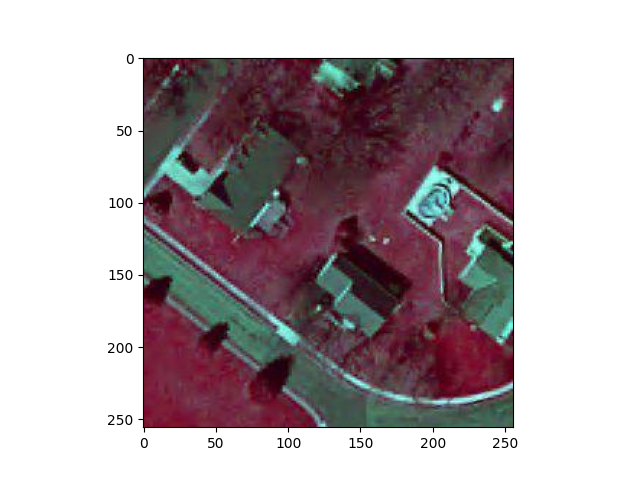

[20.14069264069265, 66.27056277056272]
[29.83766233766235, 55.18831168831164]
[42.305194805194816, 42.72077922077918]
[48.53896103896105, 31.638528138528102]
[60.31385281385283, 18.478354978354957]
[0.7467532467532436, 34.40909090909088]
[9.058441558441558, 25.40476190476187]
[15.29220779220779, 16.40043290043286]
[21.525974025974037, 7.3961038961038525]
[102.56493506493507, 190.25324675324674]
[114.33982683982686, 199.25757575757575]
[130.27056277056278, 211.72510822510822]
[147.5865800865801, 224.19264069264068]
[169.75108225108227, 231.1190476190476]
[193.99350649350652, 236.66017316017314]
[220.31385281385286, 235.27489177489176]
[1.4393939393939377, 153.54329004329]
[8.365800865800864, 159.77705627705623]
[18.062770562770567, 167.39610389610385]
[28.452380952380963, 175.0151515151515]
[42.997835497835496, 186.79004329004326]
[50.616883116883116, 193.0238095238095]
[59.621212121212125, 199.95021645021643]
[73.47402597402598, 208.95454545454544]
[81.0930735930736, 216.57359307359303

In [95]:
fig, ax = plt.subplots()
ax.imshow(new_image_list[89])
plt.axis('on')


input_points = []
def onclick(event):
    in_pt = [event.xdata, event.ydata]
    print(in_pt)
    input_points.append(in_pt)

    # Mark the clicked point with a red dot
    ax.plot(event.xdata, event.ydata, 'ro')
    plt.draw()

cid = fig.canvas.mpl_connect('button_press_event', onclick)

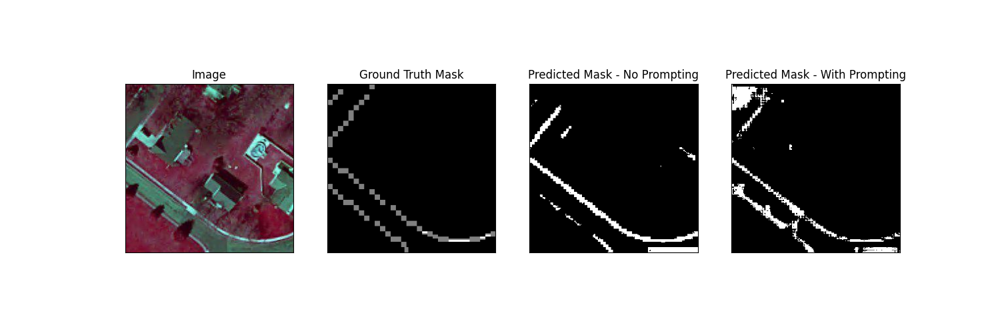

In [96]:
# load image
test_image = new_image_list[89]

# get box prompt based on ground truth segmentation map
ground_truth_mask = np.array(new_label_list[89])
prompt = get_bounding_box(ground_truth_mask)

# prepare image + box prompt for the model
noPrompt_inputs = processor(test_image, input_boxes=[[prompt]], return_tensors="pt")
prompt_inputs = processor(test_image, input_boxes=[[prompt]], input_points=[[input_points]], return_tensors="pt")

# Move the input tensor to the GPU if it's not already there
noPrompt_inputs = {k: v.to(device) for k, v in noPrompt_inputs.items()}
prompt_inputs = {k: v.to(device) for k, v in prompt_inputs.items()}

my_mito_model.eval()

# forward pass
with torch.no_grad():
    noPrompt_outputs = my_mito_model(**noPrompt_inputs, multimask_output=False)
    prompt_outputs = my_mito_model(**prompt_inputs, multimask_output=False)

# apply sigmoid
noPrompt_medsam_seg_prob = torch.sigmoid(noPrompt_outputs.pred_masks.squeeze(1))
prompt_medsam_seg_prob = torch.sigmoid(prompt_outputs.pred_masks.squeeze(1))

# convert soft mask to hard mask
noPrompt_medsam_seg_prob = noPrompt_medsam_seg_prob.cpu().numpy().squeeze()
prompt_medsam_seg_prob = prompt_medsam_seg_prob.cpu().numpy().squeeze()

noPrompt_medsam_seg = (noPrompt_medsam_seg_prob > 0.5).astype(np.uint8)
prompt_medsam_seg = (prompt_medsam_seg_prob > 0.5).astype(np.uint8)


fig, axes = plt.subplots(1, 4, figsize=(15, 5))

# Plot the test image
axes[0].imshow(np.array(test_image), cmap='viridis')
axes[0].set_title("Image")

# Plot the ground truth mask
axes[1].imshow(ground_truth_mask, cmap='gray')
axes[1].set_title("Ground Truth Mask")

# Plot the predicted mask without prompting
axes[2].imshow(noPrompt_medsam_seg, cmap='gray')
axes[2].set_title("Predicted Mask - No Prompting")

# Plot the predicted mask with prompting
axes[3].imshow(prompt_medsam_seg, cmap='gray')
axes[3].set_title("Predicted Mask - With Prompting")

for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

plt.show()

#### Example Image 9

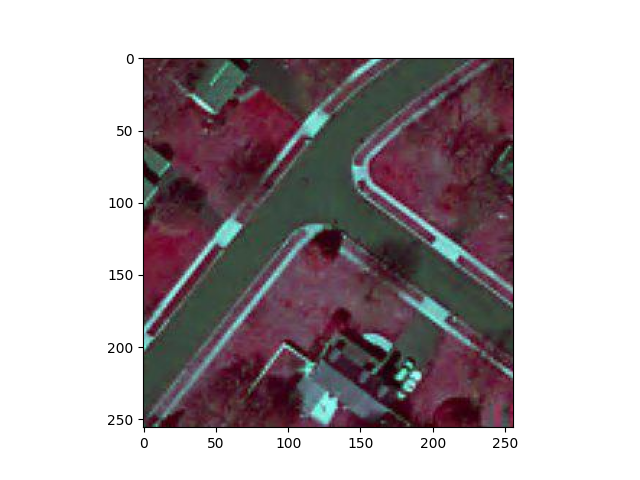

[15.984848484848484, 243.58658008658006]
[35.378787878787875, 221.4220779220779]
[56.15800865800867, 193.0238095238095]
[74.16666666666669, 170.16666666666663]
[97.71645021645023, 141.07575757575754]
[118.49567099567102, 125.14502164502161]
[133.04112554112555, 130.68614718614714]
[147.5865800865801, 141.07575757575754]
[160.05411255411258, 150.77272727272725]
[171.13636363636368, 158.39177489177487]
[185.6818181818182, 166.70346320346317]
[207.15367965367966, 183.3268398268398]
[225.16233766233768, 195.79437229437227]
[241.78571428571433, 208.26190476190473]
[252.1753246753247, 217.26623376623374]
[4.209956709956714, 180.55627705627703]
[35.378787878787875, 141.76839826839824]
[61.69913419913422, 107.1363636363636]
[79.01515151515153, 87.04978354978351]
[90.79004329004331, 71.81168831168827]
[106.72077922077924, 51.03246753246748]
[119.1883116883117, 36.487012987012946]
[130.96320346320348, 21.941558441558414]
[146.8939393939394, 9.474025974025949]
[156.59090909090912, 1.8549783549783

In [102]:
fig, ax = plt.subplots()
ax.imshow(new_image_list[90])
plt.axis('on')


input_points = []
def onclick(event):
    in_pt = [event.xdata, event.ydata]
    print(in_pt)
    input_points.append(in_pt)

    # Mark the clicked point with a red dot
    ax.plot(event.xdata, event.ydata, 'ro')
    plt.draw()

cid = fig.canvas.mpl_connect('button_press_event', onclick)

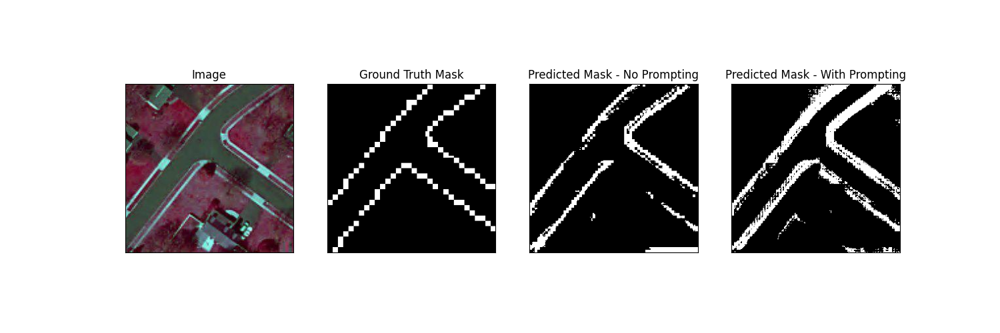

In [103]:
# load image
test_image = new_image_list[90]

# get box prompt based on ground truth segmentation map
ground_truth_mask = np.array(new_label_list[90])
prompt = get_bounding_box(ground_truth_mask)

# prepare image + box prompt for the model
noPrompt_inputs = processor(test_image, input_boxes=[[prompt]], return_tensors="pt")
prompt_inputs = processor(test_image, input_boxes=[[prompt]], input_points=[[input_points]], return_tensors="pt")

# Move the input tensor to the GPU if it's not already there
noPrompt_inputs = {k: v.to(device) for k, v in noPrompt_inputs.items()}
prompt_inputs = {k: v.to(device) for k, v in prompt_inputs.items()}

my_mito_model.eval()

# forward pass
with torch.no_grad():
    noPrompt_outputs = my_mito_model(**noPrompt_inputs, multimask_output=False)
    prompt_outputs = my_mito_model(**prompt_inputs, multimask_output=False)

# apply sigmoid
noPrompt_medsam_seg_prob = torch.sigmoid(noPrompt_outputs.pred_masks.squeeze(1))
prompt_medsam_seg_prob = torch.sigmoid(prompt_outputs.pred_masks.squeeze(1))

# convert soft mask to hard mask
noPrompt_medsam_seg_prob = noPrompt_medsam_seg_prob.cpu().numpy().squeeze()
prompt_medsam_seg_prob = prompt_medsam_seg_prob.cpu().numpy().squeeze()

noPrompt_medsam_seg = (noPrompt_medsam_seg_prob > 0.5).astype(np.uint8)
prompt_medsam_seg = (prompt_medsam_seg_prob > 0.5).astype(np.uint8)


fig, axes = plt.subplots(1, 4, figsize=(15, 5))

# Plot the test image
axes[0].imshow(np.array(test_image), cmap='viridis')
axes[0].set_title("Image")

# Plot the ground truth mask
axes[1].imshow(ground_truth_mask, cmap='gray')
axes[1].set_title("Ground Truth Mask")

# Plot the predicted mask without prompting
axes[2].imshow(noPrompt_medsam_seg, cmap='gray')
axes[2].set_title("Predicted Mask - No Prompting")

# Plot the predicted mask with prompting
axes[3].imshow(prompt_medsam_seg, cmap='gray')
axes[3].set_title("Predicted Mask - With Prompting")

for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

plt.show()

#### Example Image 10

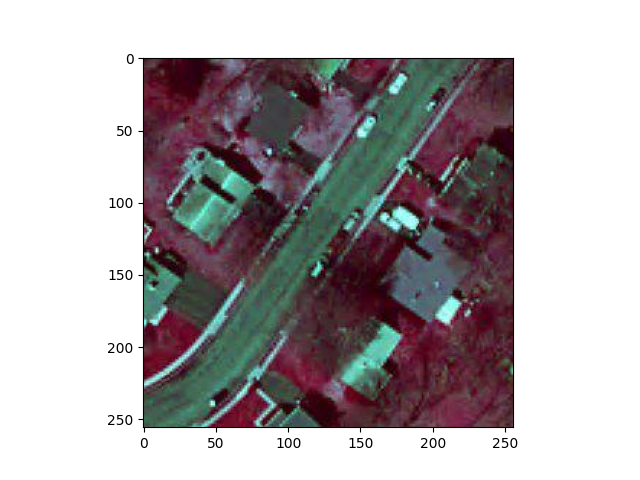

[49.924242424242436, 249.1277056277056]
[77.62987012987014, 220.03679653679652]
[98.40909090909093, 191.6385281385281]
[112.26190476190479, 172.24458874458873]
[126.80735930735932, 150.77272727272725]
[138.5822510822511, 135.534632034632]
[152.43506493506496, 115.4480519480519]
[17.370129870129873, 215.88095238095235]
[51.309523809523824, 177.78571428571425]
[67.93290043290045, 154.2359307359307]
[79.70779220779221, 137.61255411255408]
[92.86796536796538, 120.29653679653677]
[103.25757575757578, 105.05844155844153]
[165.59523809523813, 96.05411255411252]
[191.91558441558442, 55.88095238095232]
[214.7727272727273, 26.09740259740255]
[230.01082251082255, 6.010822510822436]
[125.42207792207793, 71.81168831168827]
[142.04545454545456, 48.95454545454541]
[162.82467532467535, 19.863636363636317]


In [112]:
fig, ax = plt.subplots()
ax.imshow(new_image_list[95])
plt.axis('on')


input_points = []
def onclick(event):
    in_pt = [event.xdata, event.ydata]
    print(in_pt)
    input_points.append(in_pt)

    # Mark the clicked point with a red dot
    ax.plot(event.xdata, event.ydata, 'ro')
    plt.draw()

cid = fig.canvas.mpl_connect('button_press_event', onclick)

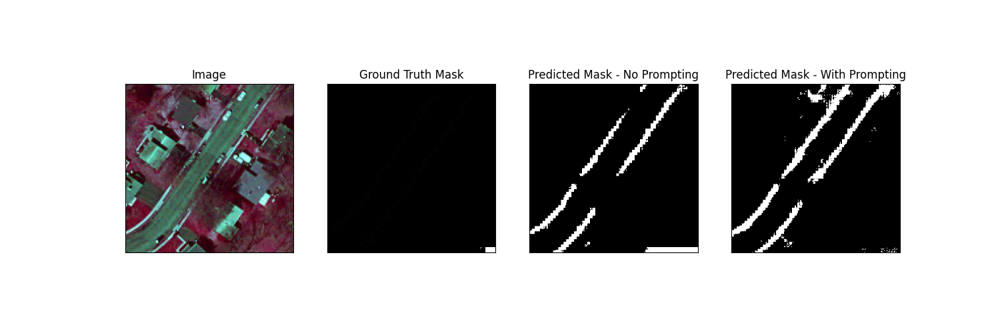

In [113]:
# load image
test_image = new_image_list[95]

# get box prompt based on ground truth segmentation map
ground_truth_mask = np.array(new_label_list[95])
prompt = get_bounding_box(ground_truth_mask)

# prepare image + box prompt for the model
noPrompt_inputs = processor(test_image, input_boxes=[[prompt]], return_tensors="pt")
prompt_inputs = processor(test_image, input_boxes=[[prompt]], input_points=[[input_points]], return_tensors="pt")

# Move the input tensor to the GPU if it's not already there
noPrompt_inputs = {k: v.to(device) for k, v in noPrompt_inputs.items()}
prompt_inputs = {k: v.to(device) for k, v in prompt_inputs.items()}

my_mito_model.eval()

# forward pass
with torch.no_grad():
    noPrompt_outputs = my_mito_model(**noPrompt_inputs, multimask_output=False)
    prompt_outputs = my_mito_model(**prompt_inputs, multimask_output=False)

# apply sigmoid
noPrompt_medsam_seg_prob = torch.sigmoid(noPrompt_outputs.pred_masks.squeeze(1))
prompt_medsam_seg_prob = torch.sigmoid(prompt_outputs.pred_masks.squeeze(1))

# convert soft mask to hard mask
noPrompt_medsam_seg_prob = noPrompt_medsam_seg_prob.cpu().numpy().squeeze()
prompt_medsam_seg_prob = prompt_medsam_seg_prob.cpu().numpy().squeeze()

noPrompt_medsam_seg = (noPrompt_medsam_seg_prob > 0.5).astype(np.uint8)
prompt_medsam_seg = (prompt_medsam_seg_prob > 0.5).astype(np.uint8)


fig, axes = plt.subplots(1, 4, figsize=(15, 5))

# Plot the test image
axes[0].imshow(np.array(test_image), cmap='viridis')
axes[0].set_title("Image")

# Plot the ground truth mask
axes[1].imshow(ground_truth_mask, cmap='gray')
axes[1].set_title("Ground Truth Mask")

# Plot the predicted mask without prompting
axes[2].imshow(noPrompt_medsam_seg, cmap='gray')
axes[2].set_title("Predicted Mask - No Prompting")

# Plot the predicted mask with prompting
axes[3].imshow(prompt_medsam_seg, cmap='gray')
axes[3].set_title("Predicted Mask - With Prompting")

for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

plt.show()

### Centerline Approach

In this approach, we try to convert the segmented sidewalks into lines. We use a text prompt to retrieve the bounding box of the trees in an image via LangSAM. Taking these two segments, we attempt to connect the endpoints of the sidewalk segments through the bounding box of the tree.

In [ ]:
!pip install segment-geospatial groundingdino-py leafmap localtileserver

In [34]:
import leafmap
from samgeo import tms_to_geotiff
from samgeo.text_sam import LangSAM

In [36]:
# download LangSAM and initialize the text prompt
sam = LangSAM()
text_prompt = "tree"

GroundingDINO_SwinB.cfg.py:   0%|          | 0.00/1.01k [00:00<?, ?B/s]

final text_encoder_type: bert-base-uncased


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

groundingdino_swinb_cogcoor.pth:   0%|          | 0.00/938M [00:00<?, ?B/s]

Downloading: "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth" to /root/.cache/torch/hub/checkpoints/sam_vit_h_4b8939.pth
100%|██████████| 2.39G/2.39G [00:39<00:00, 65.1MB/s]


#### Example Image 1

We try to implement this approach on an image from our validation dataset.

In [60]:
# we use LangSAM to retrieve the bounding box of the trees in the image using a text prompt
x = sam.predict(new_image_list[106], text_prompt, box_threshold=0.24, text_threshold=0.24, return_results = True)

In [61]:
x

(tensor([[[False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          ...,
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False]],
 
         [[False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          ...,
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False],
          [False, False, False,  ..., False, False, False]]]),
 tensor([[101.0986, 122.7835, 206.9221, 207.7129],
         [ 49.7945,  90.3319,  99.4963, 136.8003]]),
 ['tree', 'tree'],
 tensor([0.5220, 0.2669]))

We visualize the original image with the bounding boxes of the trees drawn on it

In [65]:
import numpy as np
from PIL import Image, ImageDraw

original_image = new_image_list[106]

image_copy = original_image.copy()

image_np = np.array(image_copy)

# these are the bounding boxes generated by LangSAM
bounding_boxes = [
    [101.0986, 122.7835, 206.9221, 207.7129],
    [ 49.7945,  90.3319,  99.4963, 136.8003]
]

draw = ImageDraw.Draw(image_copy)
for bbox in bounding_boxes:
    x_min, y_min, x_max, y_max = bbox
    draw.rectangle([(x_min, y_min), (x_max, y_max)], outline="green", width=2)

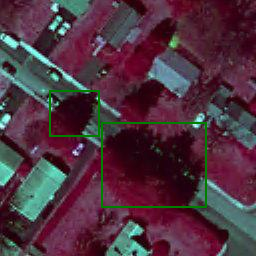

In [66]:
image_copy

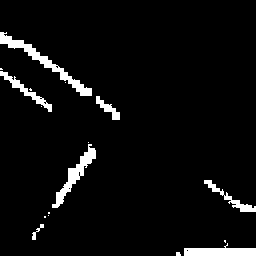

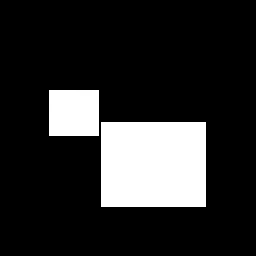

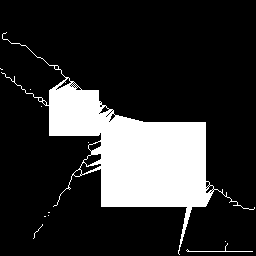

In [77]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from skimage.morphology import skeletonize
from scipy.spatial import distance

# Function to extract centerlines from a binary mask
def extract_centerlines(mask):
    skeleton = skeletonize(mask)
    return skeleton

# Function to identify occlusions in the sidewalk mask caused by tree segments
def identify_occlusions(sidewalk_mask, tree_bboxes):
    occlusion_mask = np.zeros_like(sidewalk_mask, dtype=np.uint8)

    for tree_bbox in tree_bboxes:
        x_min, y_min, x_max, y_max =  map(int, tree_bbox)

        occlusion_mask[y_min:y_max, x_min:x_max] = 255

    reverse_mask = cv2.bitwise_not(sidewalk_mask)
    occluded_sidewalk = cv2.bitwise_and(reverse_mask, occlusion_mask)

    return occluded_sidewalk

# Function to connect endpoints of sidewalk centerlines to bridge occluded segments
def connect_endpoints(sidewalk_centerlines, occluded_sidewalk):
    sidewalk_centerlines = np.uint8(sidewalk_centerlines)

    endpoints = cv2.findNonZero(cv2.bitwise_and(sidewalk_centerlines, 1))

    # Find nearest endpoints for each occluded region and connect nearest endpoint to occluded region
    for occlusion_region in np.argwhere(occluded_sidewalk):
        nearest_endpoint = min(endpoints, key=lambda endpoint: distance.cdist([occlusion_region], [endpoint.squeeze()])[0][0])

        cv2.line(sidewalk_centerlines, tuple(nearest_endpoint.squeeze()), tuple(occlusion_region[::-1]), 1, 1)

    return sidewalk_centerlines


sidewalk_mask = noPrompt_medsam_seg
tree_bboxes = [(101.0986, 122.7835, 206.9221, 207.7129),
    (49.7945,  90.3319,  99.4963, 136.8003)]

sidewalk_centerlines = extract_centerlines(sidewalk_mask)

occluded_sidewalk = identify_occlusions(sidewalk_mask, tree_bboxes)

connected_centerlines = connect_endpoints(sidewalk_centerlines.copy(), occluded_sidewalk)

cv2_imshow(sidewalk_mask * 255)
cv2_imshow(occluded_sidewalk)
cv2_imshow(connected_centerlines * 255)

As we can see from the above visualizations, the sidewalks are getting converted to lines well, but we have no way to determine the endpoints of the sidewalk segments detected and also cannot connect the two endpoints through the tree segment.